# Offline position tracking

The aim is to improve our position tracking with some offline analysis. 

We can use the video of positrack2 if it is available. 

We can apply a gh filter (sort of Kalman filter) to obtain a more reliable measure of where the mouse is.

We can also use the filter to fill up small gap in the path of the animal.

We should eventually move this code to the `positrack2` repository.


## positrack2 sessions



In [2]:
%load_ext autoreload
%autoreload 2
%run setup_project.py
prepareSessionsForSpatialAnalysisProject(sSesList,myProject.sessionList)


Project name: autopi_ca1
dataPath: /adata/projects/autopi_ca1
dlcModelPath: /adata/models
Reading /adata/projects/autopi_ca1/sessionList
We have 44 testing sessions in the list
See myProject and sSesList objects
Loading Animal_pose and Spike_train, sSes.ap and sSes.cg


100%|████████████████████████████████████████████████████████████| 44/44 [00:33<00:00,  1.31it/s]


Loading ses.trial_table_simple as ses.trials
Create condition intervals in ses.intervalDict


In [2]:
for i,ses in enumerate(sSesList):
    print(i,ses.name)
    if os.path.exists(ses.path+"/"+ses.trial_names[0]+".positrack"):
        pass
    elif os.path.exists(ses.path+"/"+ses.trial_names[0]+".positrack2"):
        pass
    else:
        print(ses.name,"No valid position data file")


0 mn5824-20112020-0107
1 mn5824-22112020-0107
2 mn5824-24112020-0107
3 mn5824-02122020-0106
4 mn711-28012021-0106
5 mn711-30012021-0106
6 mn711-31012021-0107
7 mn711-01022021-0107
8 mn711-02022021-0108
9 mn711-03022021-0107
10 mn711-04022021-0107
11 mn2739-11022021-0107
12 mn2739-15022021-0105
13 mn2739-16022021-0106
14 mn2739-17022021-0106
15 mn2739-21022021-0106
16 mn3246-09042021-0106
17 mn3246-10042021-0106
18 mn3246-12042021-0106
19 mn3246-14042021-0106
20 mn1173-02052021-0107
21 mn1173-06052021-0107
22 mn1173-08052021-0107
23 mn1173-09052021-0108
24 mn1173-11052021-0108
25 TYY9524-16082021-0106
26 TYY9524-18082021-0106
27 TYY9524-20082021-0106
28 TYY9524-22082021-0106
29 TYY9524-23082021-0105
30 TYY9524-25082021-0106
31 mn5618-07072021-0107
32 mn5618-09072021-0106
33 mn5618-12072021-0110
34 TYY5622-07092021-0106
35 TYY5622-17092021-0106
36 TYY5622-19092021-0106
37 TYY5622-20092021-0106
38 mn9686-20102021-0106
39 mn9686-26102021-0106
40 mn9686-27102021-0106
41 mn9686-28102021-0107

## Deeplabcut the positrack2 video file

If you have saved a video using positrack2, you can run a dlc model on it to track this animal. This source of information can then be combined with the online tracking to improve tracking.

The code for this in in dlc_on_positrack2_videos


# Offline postition processing

We need a function to do all the needed processing on the position data.

This should operate on single `positrack` or `positrack2` files. At the moment only on positrack2



In [265]:
from pathlib import Path
from spikeA.Session import Session

def remove_speed_jumps(df, time, px_per_cm , max_speed=100):
    """
    set x,y,hd to np.nan when speed is above a threshod
    
    Argument
    df: DataFrame with x, y , hd data
    time: time of each frame in DataFrame
    """

    dt = np.diff(time,append = np.nan)
    dx = np.diff(df.x,append = np.nan)
    dy = np.diff(df.y,append = np.nan)
    speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
    df["speed"] = speed
    
    speed_issues = speed > max_speed
    print("Number of speed issues: {}".format(np.sum(speed_issues)))
    
    df.x[speed_issues] = np.nan
    df.y[speed_issues] = np.nan
    df.hd[speed_issues] = np.nan
    df.speed[speed_issues] = np.nan
    
    return df

def correct_head_direction_180_flip(df, time, px_per_cm , min_speed=10, max_angle=np.pi/1.2):
    """
    Rotate by pi the head-direction if the difference between heading and head-direction is more than max_angle when the animal is moving above a speed threshold. 
    
    Mice do not move forward with their head pointing backward. If we get this in our data, it is likely due to a swap in the 2 LEDs 
    
    Argument
    df: DataFrame with x, y , hd data
    time: time of each frame in DataFrame
    px_per_cm: pixels per cm
    min_speed: minimal speed at which heading and head-direction should be compared
    max_angle: max angle between heading and head-direction that is considered valid.
    """
        
    dt = np.diff(time,append = np.nan)
    dx = np.diff(df.x,append = np.nan)
    dy = np.diff(df.y,append = np.nan)
    speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
    df["speed"] = speed
    df["heading"] = np.arctan2(dy,dx)
    
    # angle between 2 vector is the acos of the dot product
    delta_angle = np.arccos( np.cos(df.hd)*np.cos(df.heading)+np.sin(df.hd)*np.sin(df.heading) )
    
    swap_indices = np.logical_and(df.speed>min_speed,delta_angle>max_angle)
    
    df.hd[swap_indices] = np.arctan2(np.sin(df.hd[swap_indices]+np.pi),np.cos(df.hd[swap_indices]+np.pi))
    
    return df

def merge_online_offline_tracking(df,df1,prob=0.995):
    """
    Function to fill missing x,y,hd from online tracking with dlc model output.
    
    This only works if we have done offline tracking. 
    
    We fill only when dlc was pretty sure about detecting the mouse (data above prob threshold)
    
    Arguments:
    df : online tracking data (positrack2 file)
    df1: offline tracking data (offline dlc model output)
    """
    
    
    i1 = np.isnan(df.x) # df is nan
    print("Proportion of nan in online tracking: {:.3f}".format(np.sum(np.isnan(df.x)/df.x.shape[0])))
    
    if df1 is None:
        print("No valid df1")
        return
    
    i2 = np.logical_and(df1.LedLeft_p>prob, df1.LedRight_p>prob) # we have good dlc confidence
    i = np.logical_and(i1,i2)
    
    print("Proportion of nan in offline tracking: {:.3f}".format(np.sum(np.isnan(df1.x)/df1.x.shape[0])))
                                                                 
    print("Number of np.nan filling using dlc: {}".format(np.sum(i)))
    df.x[i] = df1.x[i]
    df.y[i] = df1.y[i]
    df.hd[i] = df1.hd[i]
                                                                 
    print("Proportion of nan after merging: {:.3f}".format(np.sum(np.isnan(df.x)/df.x.shape[0])))
                                                                 
    return df


        
def gh_filter(estimated_x, velocity_x, 
              observations, dts, 
              position_scale=6.0/10,velocity_scale=2.0/10, 
              min_value = 0,
              max_value = 1000,
              maxNans = 10, maxDist = 100, do_print=False):     
    """
    gh_filter for 1D position of the animal
    
    It is a first draft. It works on 1D data.
    
    
    Arguments:
    estimated_x: estimated starting position
    velocity_x: estimated starting velocity
    observations : observations
    dts: delta time between observations
    position_scale: how much weight is given to observation relative to prediction 
    velocity_scale: how much weight is given to observation relative to prediction
    min_value: minimum value that that model can return
    max_value: maximum value that the model can return
    maxNans: maximum of consecutive np.nan before we stop predicting position
    maxDist: maximum distance between observation and prediction after which we disregard the observation
    
    """
    # storage for the filtered results
    estimatesToUse, estimates, predictions = [estimated_x],[estimated_x], []
    
    consecutiveNans=0

    # most filter literature uses 'z' for measurements
    for i, (z,dt) in enumerate(zip(observations,dts)): 
        # predict new position
        #print(z,dt)
        if consecutiveNans>maxNans:
            velocity_x = 0 # velocity set to 0 after too long without sensor inputs
        
            
        
       
        predicted_x = estimated_x + velocity_x * dt
        velocity_x = velocity_x
        

        # update filter 
        if not np.isnan(z) and dt != 0.0 :
            residual = z - predicted_x
            
            if residual > maxDist or residual < 0-maxDist : # the observed is very far from where we think the animal is     
                velocity_x = velocity_x + 0.01 * residual/dt
                estimated_x = predicted_x + 0.01 * residual
                consecutiveNans+=1 # treat this as a Nan (as it is likely a false positive)
            else:
                velocity_x = velocity_x + velocity_scale * residual/dt
                estimated_x = predicted_x + position_scale * residual
                consecutiveNans=0
            
        else : # invalid input, keep predicting
            velocity_x = velocity_x
            estimated_x = predicted_x
            consecutiveNans+=1
        
        # check that estimated_x is within possible range
        #if estimated_x < min_value:
        #    estimated_x = min_value
        #if estimated_x > max_value:
        #    estimated_x = max_value
        

        # save and log
        estimates.append(estimated_x)
        predictions.append(predicted_x)
        
        if consecutiveNans < maxNans:
            estimatesToUse.append(estimated_x)
        else:
            estimatesToUse.append(np.nan)
        
        
        
        if do_print:
            print("{}, previous estimate: {:.2f}, predicted: {:.2f}, estimate:{:.2f}, z:{:.2f}, vel_x: {:.2f}".format(i,estimates[-1], predicted_x, estimated_x,z,velocity_x))

    return np.array(estimatesToUse)[1:], estimates, predictions





def post_processing_positrack2_files(sSes,extension="positrack2",alt_extension="offline.positrack2"):
    """
    Function to apply post processing to the position tracking data
    
    Work on all the positrack2 files for the spikeA session
    
    It can use a second tracking data file (offline dlc) to improve tracking (see dlc_on_positrack2_videos)
    
    
    Argument:
    
    sSes: spikeA session
    extension: extension of the positrack2 file
    alt_extension: name of the extension for alternative position data file (see dlc_on_positrack2_videos)
    
    """
    for t in sSes.trial_names:
        post_processing_positrack2_file(sSes,t)


def post_processing_positrack2_file(sSes, trialName, extension="positrack2",alt_extension="offline.positrack2", output_extension="positrack2_post"):
    """
    Function to apply post processing to the position tracking data
    
    Work on a sinble positrack2 file
    
    sSes: spikeA session
    trial_name: name of a single trial
    extension: extension of the positrack2 file
    alt_extension: name of the extension for alternative position data file (see dlc_on_positrack2_videos)
    
    """
    if sSes is None:
        raise TypeError("Please provide a session object with the ses argument")
    
    if not (issubclass(type(sSes),Session) or isinstance(sSes,Session)): 
        raise TypeError("ses should be a subclass of the Session class")
    
    
    posiFn = sSes.path+"/"+trialName+"."+extension
        
    positrack_file = Path(posiFn)
    if not positrack_file.exists() :
        raise OSError("positrack file {} missing".format(positrack_file_name))
    print("Loading ",positrack_file)
    df = pd.read_csv(positrack_file)
    print("positrack2 file with {} lines".format(df.shape[0]))
    print("Proportion of nan in original positrack2 file: {:.3f}".format(np.sum(np.isnan(df.x)/df.x.shape[0])))
    
    
    
    posiAltFn = sSes.path+"/"+trialName+"."+alt_extension
    positrack_alt_file = Path(posiAltFn)
    if positrack_alt_file.exists() :
        print("Loading ",positrack_alt_file)
        df1 = pd.read_csv(positrack_alt_file)
    else:
        print("No ",positrack_alt_file)
        df1 = None
    
    if df1 is not None:
        if (df.shape[0] != df1.shape[0]):
            raise ValueError("the two position data file do not have the same length")
    
    

    # if there are subsequent frames with the same acquisition time, set to np.nan as it will confuse the gh filter
    dt=np.diff(df.acq_time_source_2,append=np.nan)
    indices = dt==0
    print("Number of delta time == 0: {}".format(np.sum(indices)))
    df.x[indices] = np.nan
    df.y[indices] = np.nan
    df.hd[indices] = np.nan


    df1.x[indices] = np.nan
    df1.y[indices] = np.nan
    df1.hd[indices] = np.nan

    # we want the head-direction data in radians
    if (np.nanmax(df.hd)>np.pi): # if in degrees
        df.hd = df.hd/360*np.pi*2
        df.hd = np.arctan2(np.sin(df.hd),np.cos(df.hd))
    if df1 is not None:
        if (np.nanmax(df1.hd)>np.pi): # if in degrees
            df1.hd = df1.hd/360*np.pi*2
            df1.hd = np.arctan2(np.sin(df1.hd),np.cos(df1.hd))
    
    
    # remove speed jumps
    df = remove_speed_jumps(df = df,
                        time = df.acq_time_source_2,
                        px_per_cm = sSes.px_per_cm)
    if df1 is not None:
        df1 = remove_speed_jumps(df = df1,
                            time = df.acq_time_source_2,
                            px_per_cm = sSes.px_per_cm)

    # remove hd flips
    df = correct_head_direction_180_flip(df,df.acq_time_source_0,sSes.px_per_cm)
    if df1 is not None:
        df1 = correct_head_direction_180_flip(df1,df.acq_time_source_0,sSes.px_per_cm)

        
    # use the dlc model output to fill in the np.nan from online tracking
    if df1 is not None:                        
        merge_online_offline_tracking(df,df1)
    
    
    # apply the gh filter
    
    position_scale = 6.0/10
    velocity_scale = 2.0/10

    velocity_x = 0
    initial_x = df.x[~np.isnan(df.x)].iloc[0]
    initial_y = df.y[~np.isnan(df.y)].iloc[0]
        
    ex,estimates_x, predictions = gh_filter(estimated_x=initial_x, velocity_x=velocity_x,                                                  
                                                  observations=df.x,
                                                  dts = dt,
                                                  position_scale = position_scale, velocity_scale = velocity_scale,
                                                  min_value = np.nanmax(df.x),
                                                  max_value= np.nanmax(df.x),
                                                  do_print=False)   

    
    ey, estimates_y, predictions = gh_filter(estimated_x=initial_y, velocity_x=velocity_x,                                              
                                                  observations=df.y,
                                                  dts = dt,
                                                  position_scale = position_scale, velocity_scale = velocity_scale,
                                                  min_value = np.nanmin(df.y),
                                                  max_value= np.nanmax(df.y),
                                                  do_print=False) 

    i = np.logical_or(np.isnan(ex),np.isnan(ey))
    ex[i]=np.nan
    ey[i]=np.nan
    print("Proportion of np.nan after gh filtering processing: {:.3f}".format(np.sum(np.isnan(ex)/ex.shape[0])))

    
    ## saving "positrack2_post" file
    newDf = df.copy()
    newDf.x=ex
    newDf.y=ey
    
    outPosiFn = sSes.path+"/"+trialName+"."+ output_extension    
    newDf.to_csv(outPosiFn,index=False)
    print("Saving output to ",outPosiFn)
    
    
    fig,ax = plt.subplots(1,2,figsize=(20,10))
    ax[0].plot(df.x,df.y)
    ax[1].plot(newDf.x,newDf.y)
    plt.show()
    
    
    
         
    return df,newDf


In [266]:
positrack2_sessions = [ ses for ses in sSesList if ses.ap.positrack_type()=="positrack2"]

## So far, I have run this on the session 38 to 42 and I have recreated the .pose file for these sessions.

In [ ]:
sSes = sSesList[43]
post_processing_positrack2_files(sSes)

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_01.positrack2
positrack2 file with 53931 lines
Proportion of nan in original positrack2 file: 0.063
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_01.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 67
Number of speed issues: 382
Proportion of nan in online tracking: 0.064
Proportion of nan in offline tracking: 0.032
Number of np.nan filling using dlc: 1524
Proportion of nan after merging: 0.037


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.004
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_01.positrack2_post


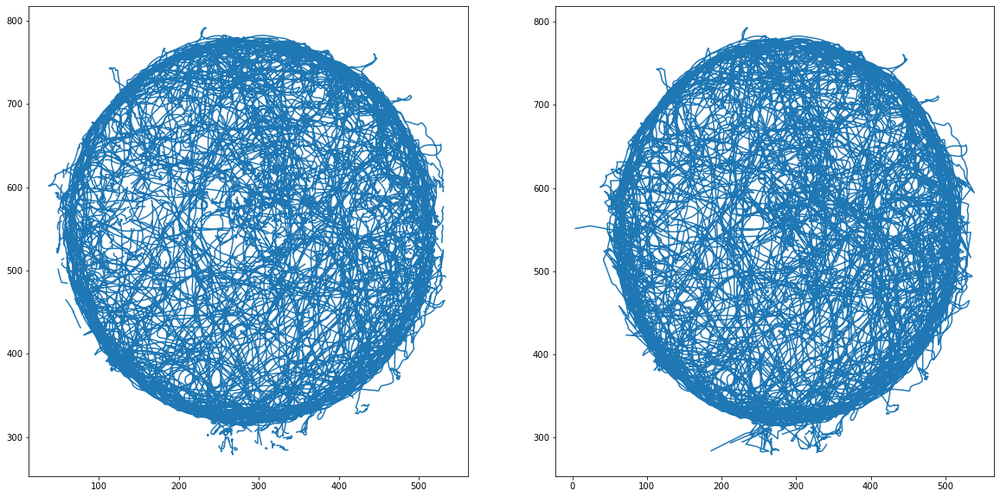

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_02.positrack2
positrack2 file with 36036 lines
Proportion of nan in original positrack2 file: 0.061
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_02.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 18
Number of speed issues: 85


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.062
Proportion of nan in offline tracking: 0.017
Number of np.nan filling using dlc: 633
Proportion of nan after merging: 0.045
Proportion of np.nan after gh filtering processing: 0.021
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_02.positrack2_post


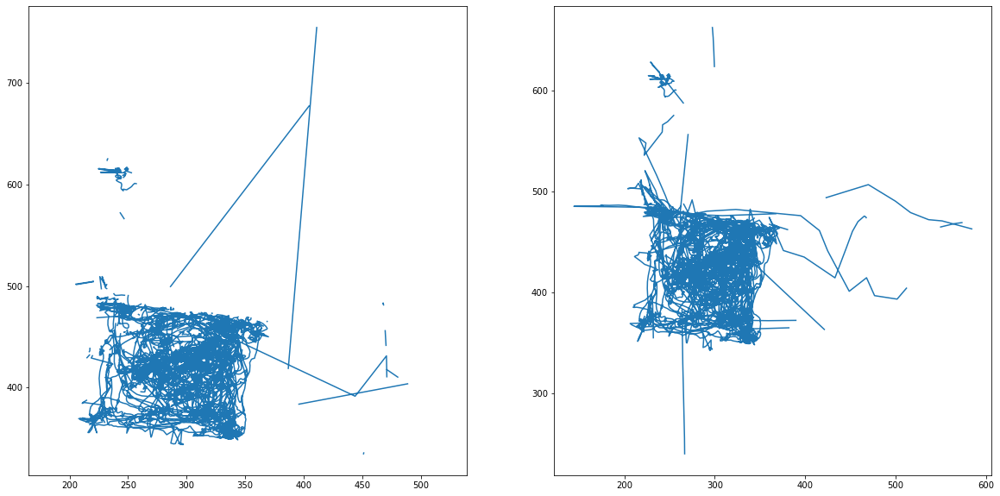

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_03.positrack2
positrack2 file with 54043 lines
Proportion of nan in original positrack2 file: 0.078
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_03.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 130
Number of speed issues: 370
Proportion of nan in online tracking: 0.081
Proportion of nan in offline tracking: 0.032
Number of np.nan filling using dlc: 2162
Proportion of nan after merging: 0.042


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.007
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_03.positrack2_post


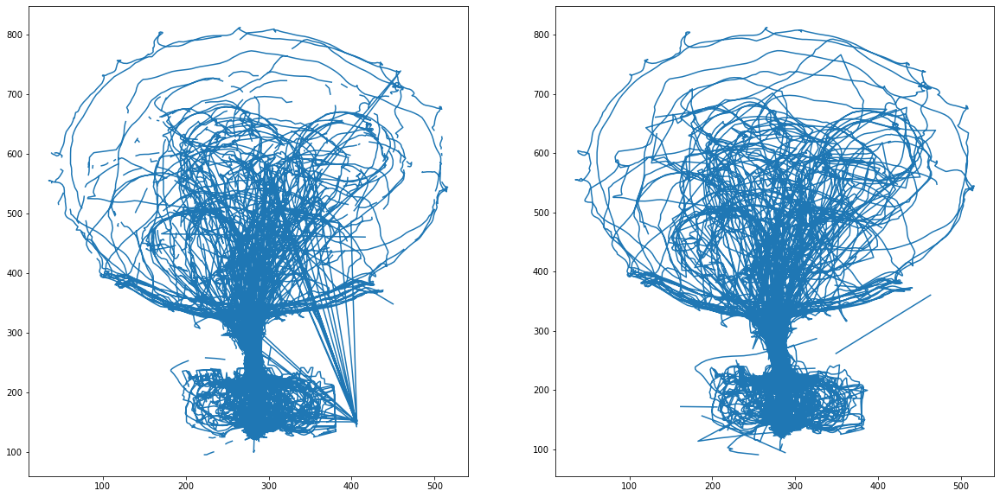

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_04.positrack2
positrack2 file with 54042 lines
Proportion of nan in original positrack2 file: 0.103
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_04.offline.positrack2
Number of delta time == 0: 1
Number of speed issues: 221
Number of speed issues: 356


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.107
Proportion of nan in offline tracking: 0.035
Number of np.nan filling using dlc: 2551
Proportion of nan after merging: 0.061
Proportion of np.nan after gh filtering processing: 0.024
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_04.positrack2_post


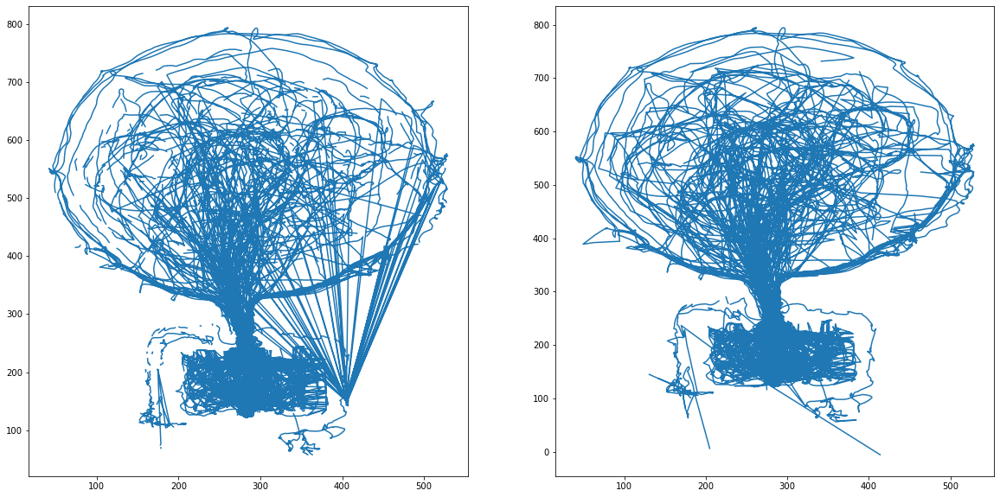

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_05.positrack2
positrack2 file with 54043 lines
Proportion of nan in original positrack2 file: 0.071
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_05.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 258
Number of speed issues: 297
Proportion of nan in online tracking: 0.076
Proportion of nan in offline tracking: 0.029
Number of np.nan filling using dlc: 2296
Proportion of nan after merging: 0.035


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.004
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_05.positrack2_post


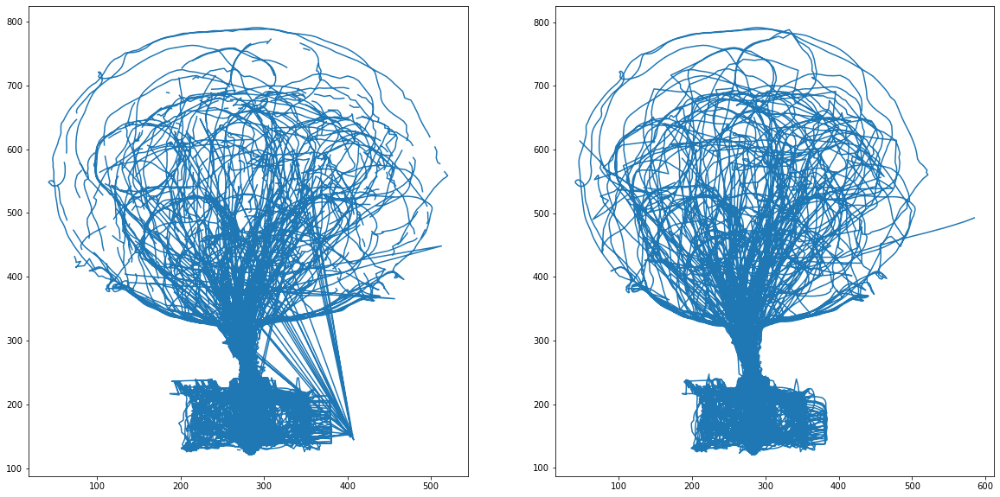

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_06.positrack2
positrack2 file with 36035 lines
Proportion of nan in original positrack2 file: 0.346
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_06.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 61
Number of speed issues: 2117
Proportion of nan in online tracking: 0.348
Proportion of nan in offline tracking: 0.201
Number of np.nan filling using dlc: 2527
Proportion of nan after merging: 0.290


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.164
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_06.positrack2_post


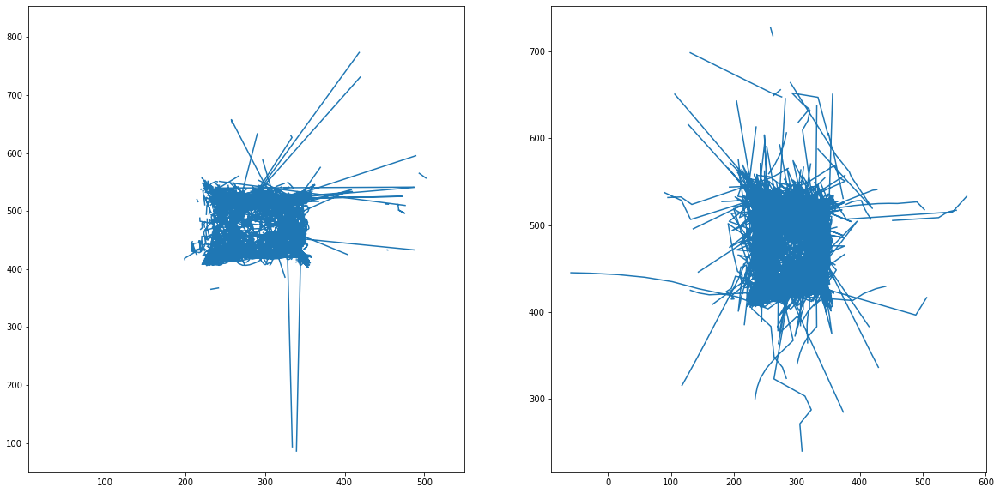

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_01.positrack2
positrack2 file with 53933 lines
Proportion of nan in original positrack2 file: 0.067
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_01.offline.positrack2
Number of delta time == 0: 3
Number of speed issues: 88
Number of speed issues: 528


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.068
Proportion of nan in offline tracking: 0.047
Number of np.nan filling using dlc: 1585
Proportion of nan after merging: 0.041
Proportion of np.nan after gh filtering processing: 0.011
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_01.positrack2_post


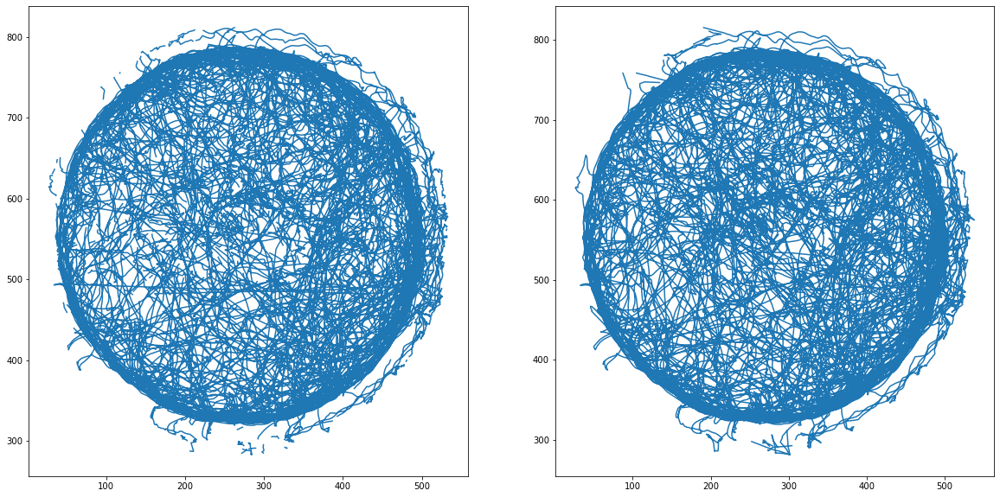

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_02.positrack2
positrack2 file with 36036 lines
Proportion of nan in original positrack2 file: 0.135
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_02.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 53
Number of speed issues: 67
Proportion of nan in online tracking: 0.136
Proportion of nan in offline tracking: 0.037
Number of np.nan filling using dlc: 1710
Proportion of nan after merging: 0.089


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.030
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_02.positrack2_post


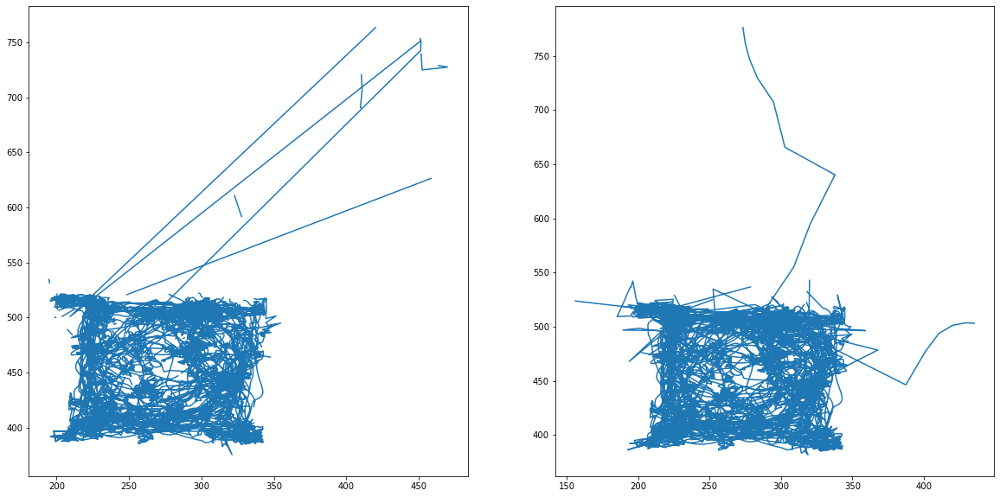

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_03.positrack2
positrack2 file with 54037 lines
Proportion of nan in original positrack2 file: 0.166
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_03.offline.positrack2
Number of delta time == 0: 1
Number of speed issues: 222
Number of speed issues: 745


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.170
Proportion of nan in offline tracking: 0.084
Number of np.nan filling using dlc: 2225
Proportion of nan after merging: 0.131
Proportion of np.nan after gh filtering processing: 0.115
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_03.positrack2_post


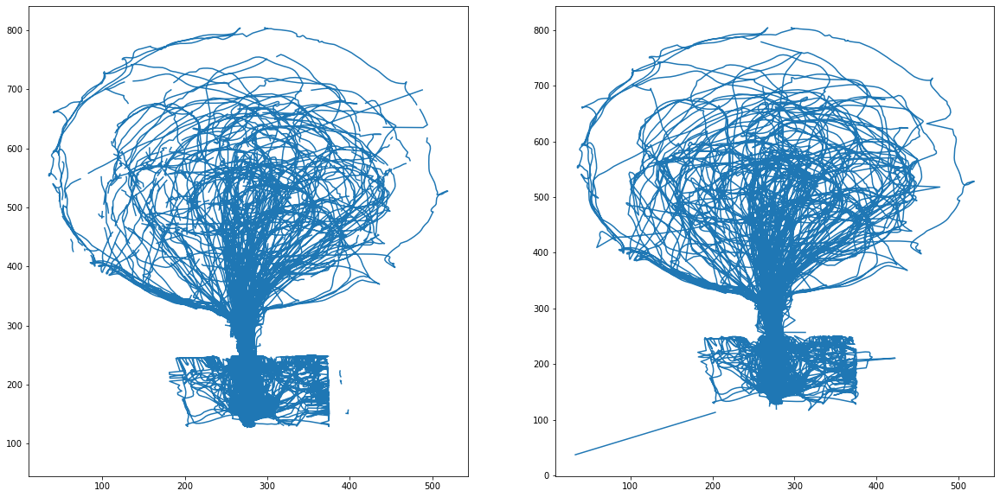

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_04.positrack2
positrack2 file with 54045 lines
Proportion of nan in original positrack2 file: 0.108
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_04.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 219
Number of speed issues: 398
Proportion of nan in online tracking: 0.112
Proportion of nan in offline tracking: 0.046


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Number of np.nan filling using dlc: 2322
Proportion of nan after merging: 0.071
Proportion of np.nan after gh filtering processing: 0.044
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_04.positrack2_post


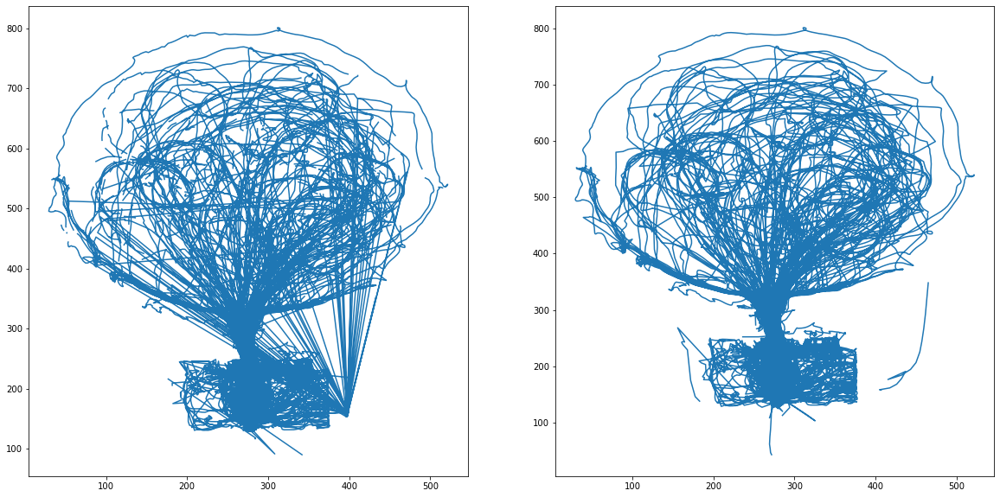

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_05.positrack2
positrack2 file with 54042 lines
Proportion of nan in original positrack2 file: 0.119
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_05.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 299
Number of speed issues: 351


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.124
Proportion of nan in offline tracking: 0.037
Number of np.nan filling using dlc: 2748
Proportion of nan after merging: 0.074
Proportion of np.nan after gh filtering processing: 0.056
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_05.positrack2_post


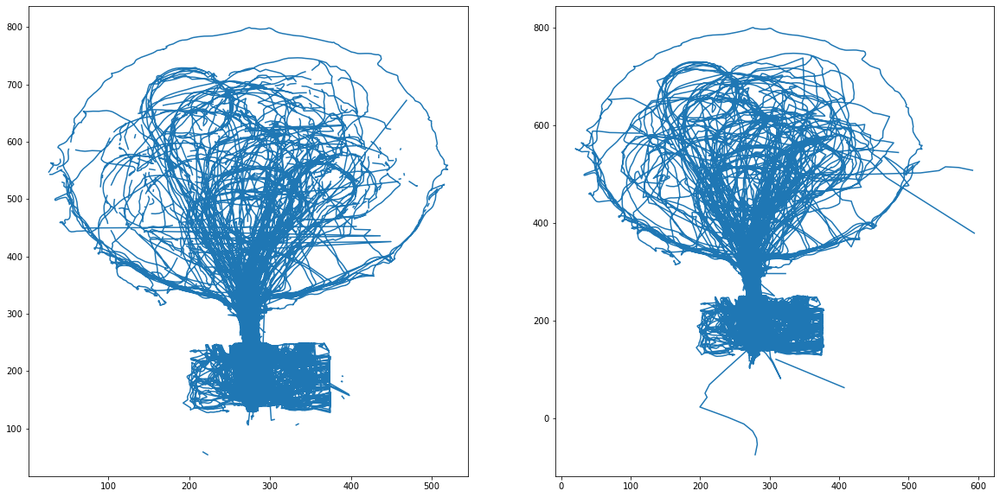

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_06.positrack2
positrack2 file with 36033 lines
Proportion of nan in original positrack2 file: 0.109
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_06.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 60
Number of speed issues: 721
Proportion of nan in online tracking: 0.111
Proportion of nan in offline tracking: 0.090
Number of np.nan filling using dlc: 973
Proportion of nan after merging: 0.089


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.058
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_06.positrack2_post


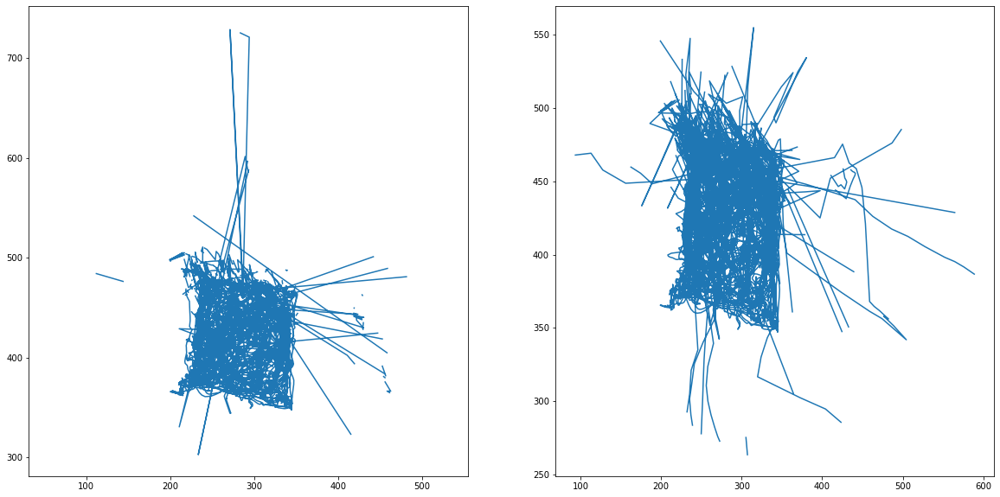

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_01.positrack2
positrack2 file with 53940 lines
Proportion of nan in original positrack2 file: 0.099
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_01.offline.positrack2
Number of delta time == 0: 1
Number of speed issues: 71
Number of speed issues: 372


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.100
Proportion of nan in offline tracking: 0.042
Number of np.nan filling using dlc: 1818
Proportion of nan after merging: 0.068
Proportion of np.nan after gh filtering processing: 0.030
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_01.positrack2_post


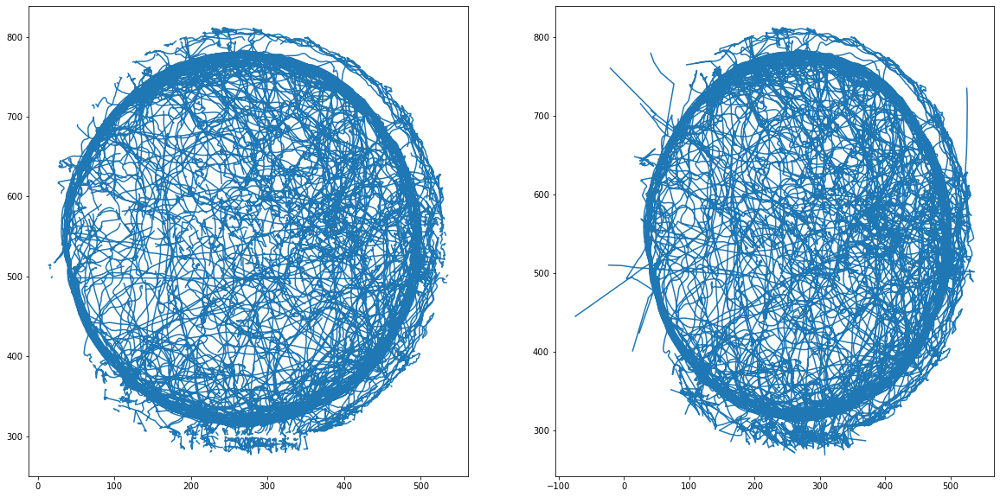

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_02.positrack2
positrack2 file with 48388 lines
Proportion of nan in original positrack2 file: 0.105
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_02.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 19
Number of speed issues: 73
Proportion of nan in online tracking: 0.105
Proportion of nan in offline tracking: 0.028
Number of np.nan filling using dlc: 1836
Proportion of nan after merging: 0.067


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.008
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_02.positrack2_post


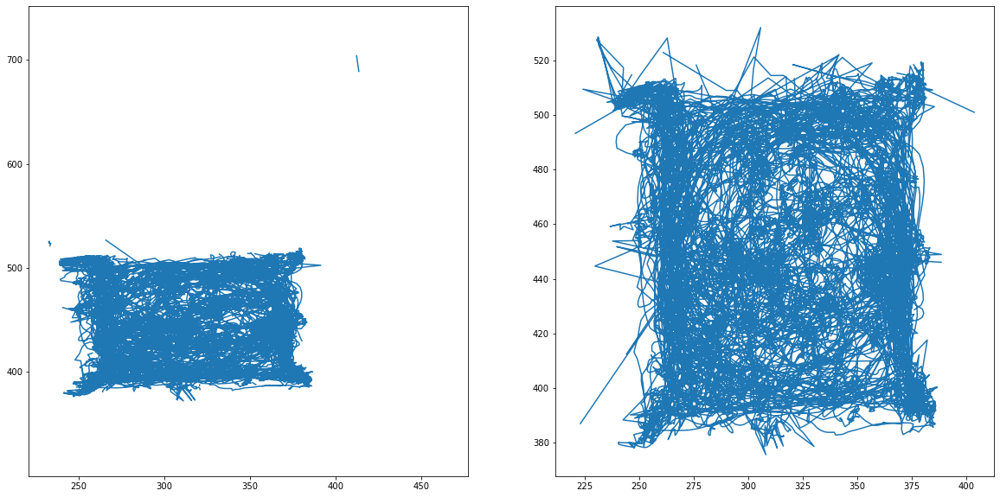

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_03.positrack2
positrack2 file with 54139 lines
Proportion of nan in original positrack2 file: 0.078
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_03.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 304
Number of speed issues: 357


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.083
Proportion of nan in offline tracking: 0.028
Number of np.nan filling using dlc: 2961
Proportion of nan after merging: 0.030
Proportion of np.nan after gh filtering processing: 0.010
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_03.positrack2_post


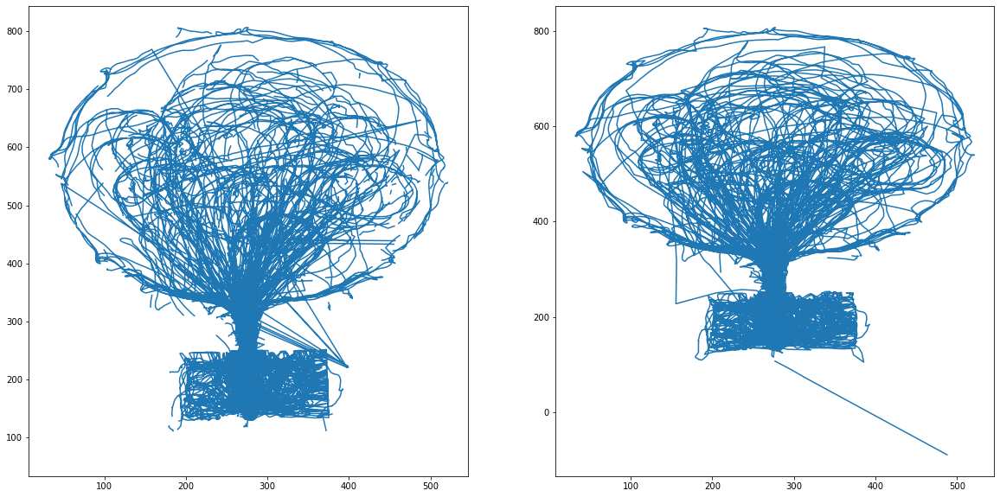

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_04.positrack2
positrack2 file with 54038 lines
Proportion of nan in original positrack2 file: 0.132
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_04.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 240
Number of speed issues: 447


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.136
Proportion of nan in offline tracking: 0.036
Number of np.nan filling using dlc: 3778
Proportion of nan after merging: 0.068
Proportion of np.nan after gh filtering processing: 0.031
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_04.positrack2_post


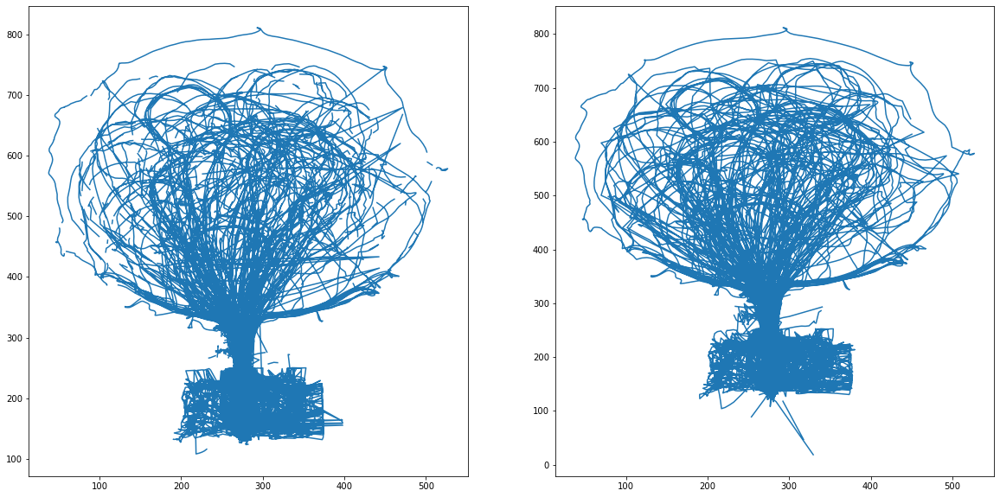

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_05.positrack2
positrack2 file with 27045 lines
Proportion of nan in original positrack2 file: 0.149
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_05.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 137
Number of speed issues: 265
Proportion of nan in online tracking: 0.154
Proportion of nan in offline tracking: 0.032
Number of np.nan filling using dlc: 2331
Proportion of nan after merging: 0.070


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.020
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_05.positrack2_post


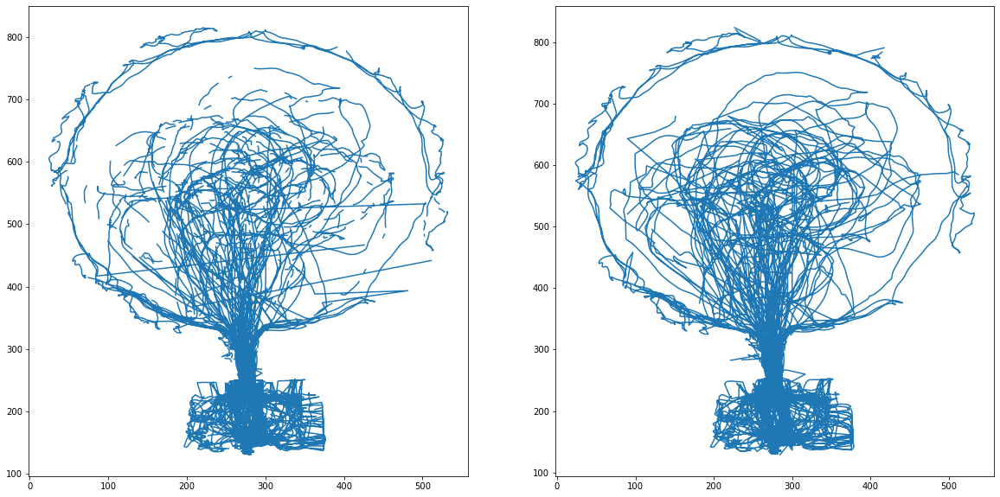

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_06.positrack2
positrack2 file with 36036 lines
Proportion of nan in original positrack2 file: 0.043
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_06.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 49
Number of speed issues: 288
Proportion of nan in online tracking: 0.044
Proportion of nan in offline tracking: 0.067
Number of np.nan filling using dlc: 418
Proportion of nan after merging: 0.035


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.018
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_06.positrack2_post


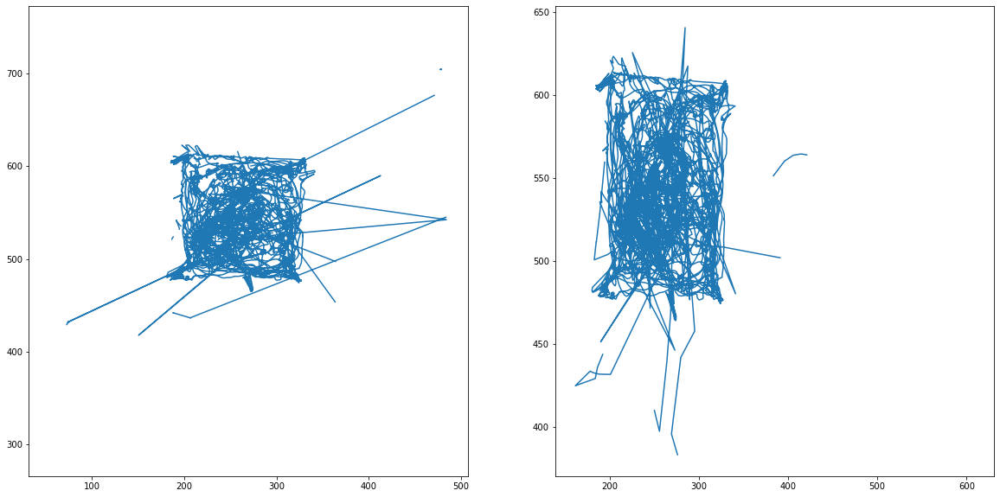

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_01.positrack2
positrack2 file with 54060 lines
Proportion of nan in original positrack2 file: 0.082
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_01.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 60
Number of speed issues: 447
Proportion of nan in online tracking: 0.083
Proportion of nan in offline tracking: 0.040
Number of np.nan filling using dlc: 1771
Proportion of nan after merging: 0.052


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.020
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_01.positrack2_post


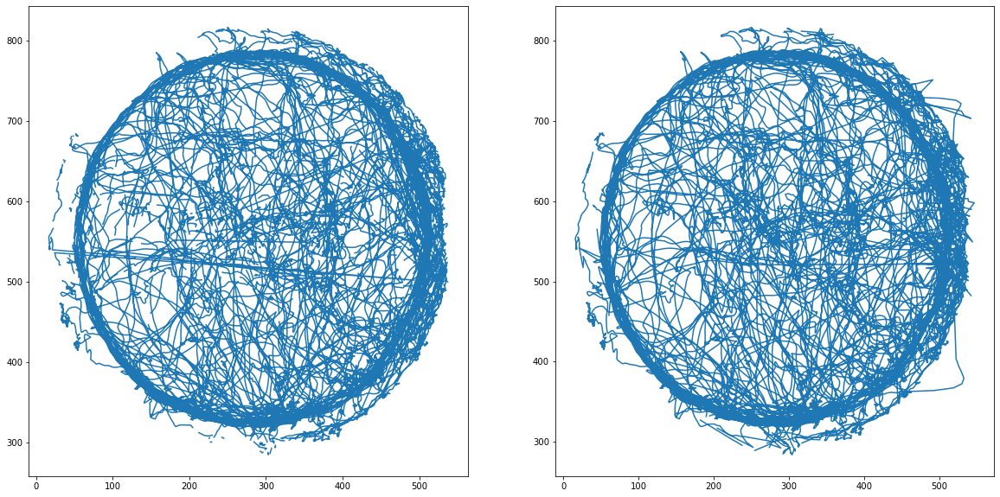

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_02.positrack2
positrack2 file with 27034 lines
Proportion of nan in original positrack2 file: 0.070
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_02.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 37
Number of speed issues: 301
Proportion of nan in online tracking: 0.072
Proportion of nan in offline tracking: 0.047
Number of np.nan filling using dlc: 701
Proportion of nan after merging: 0.048


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.040
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_02.positrack2_post


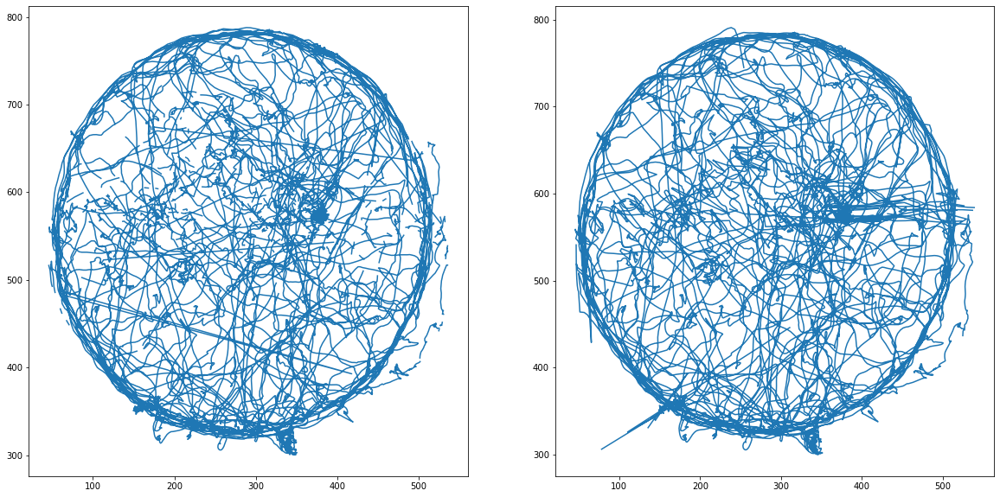

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_03.positrack2
positrack2 file with 36030 lines
Proportion of nan in original positrack2 file: 0.119
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_03.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 8
Number of speed issues: 72
Proportion of nan in online tracking: 0.119
Proportion of nan in offline tracking: 0.034
Number of np.nan filling using dlc: 1279
Proportion of nan after merging: 0.084


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.035
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_03.positrack2_post


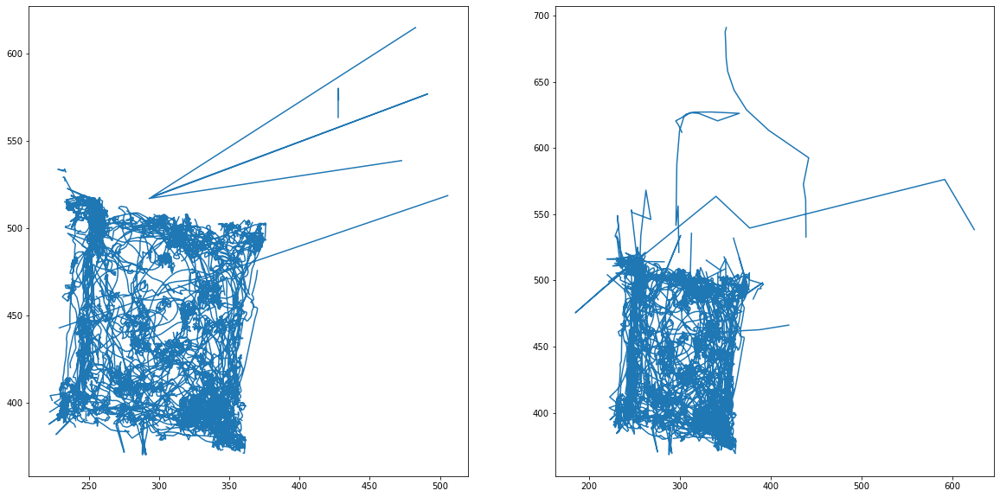

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_04.positrack2
positrack2 file with 53928 lines
Proportion of nan in original positrack2 file: 0.077
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_04.offline.positrack2
Number of delta time == 0: 1
Number of speed issues: 253
Number of speed issues: 256
Proportion of nan in online tracking: 0.081
Proportion of nan in offline tracking: 0.025
Number of np.nan filling using dlc: 2244


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan after merging: 0.041
Proportion of np.nan after gh filtering processing: 0.015
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_04.positrack2_post


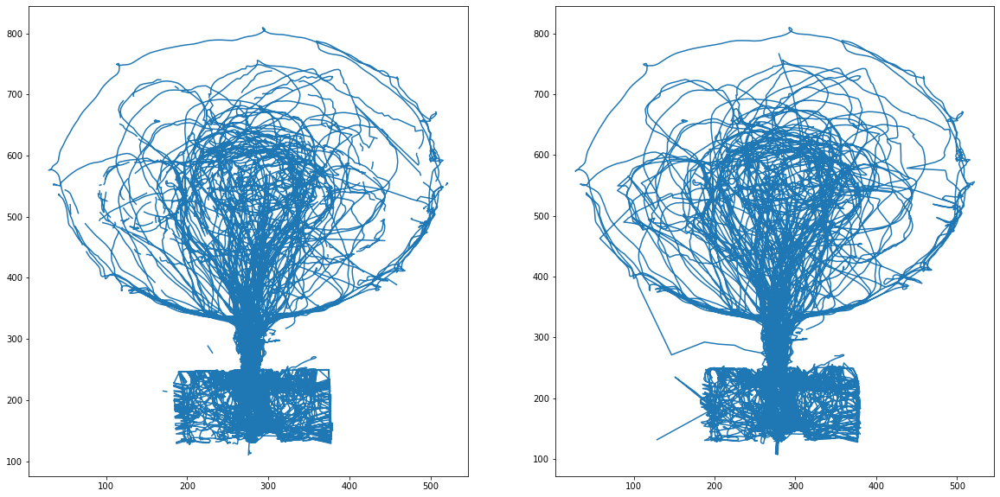

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_05.positrack2
positrack2 file with 54041 lines
Proportion of nan in original positrack2 file: 0.056
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_05.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 370
Number of speed issues: 273


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.063
Proportion of nan in offline tracking: 0.018
Number of np.nan filling using dlc: 2226
Proportion of nan after merging: 0.023
Proportion of np.nan after gh filtering processing: 0.001
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_05.positrack2_post


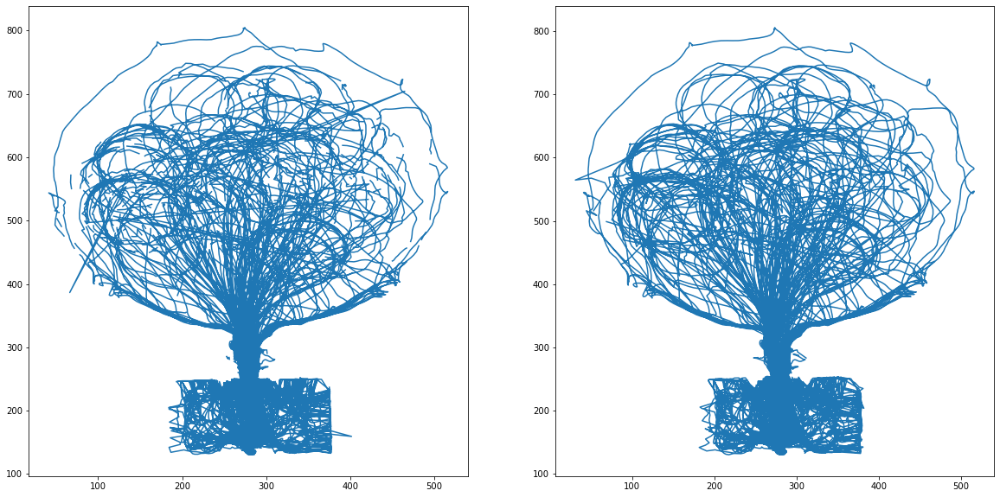

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_06.positrack2
positrack2 file with 54040 lines
Proportion of nan in original positrack2 file: 0.066
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_06.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 249
Number of speed issues: 211


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.071
Proportion of nan in offline tracking: 0.017
Number of np.nan filling using dlc: 2280
Proportion of nan after merging: 0.030
Proportion of np.nan after gh filtering processing: 0.005
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_06.positrack2_post


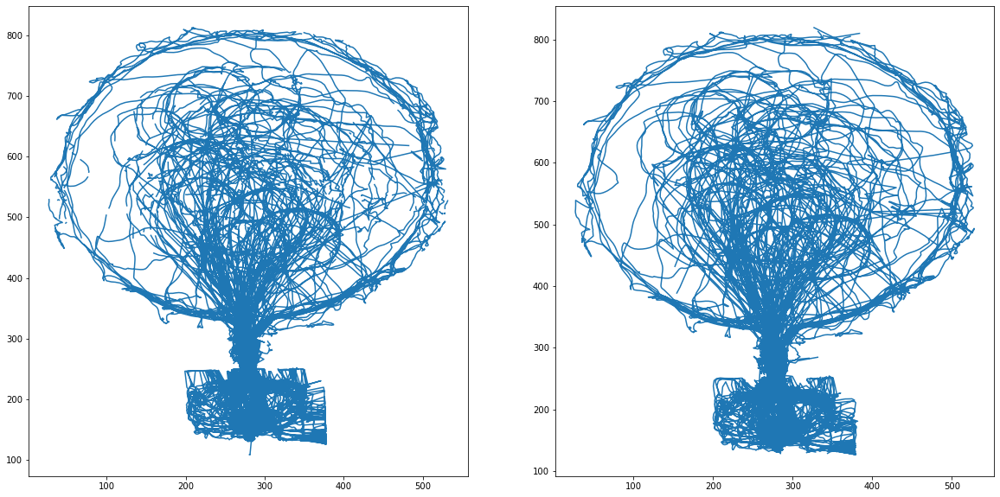

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_07.positrack2
positrack2 file with 36042 lines
Proportion of nan in original positrack2 file: 0.057
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_07.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 10
Number of speed issues: 74
Proportion of nan in online tracking: 0.057
Proportion of nan in offline tracking: 0.027
Number of np.nan filling using dlc: 618
Proportion of nan after merging: 0.040


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.006
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_07.positrack2_post


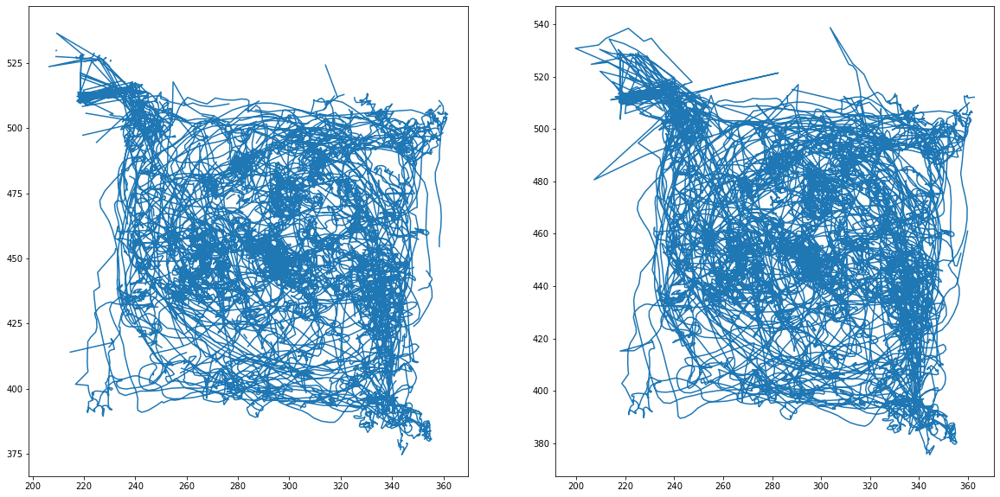

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_01.positrack2
positrack2 file with 53927 lines
Proportion of nan in original positrack2 file: 0.065
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_01.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 70
Number of speed issues: 457


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.066
Proportion of nan in offline tracking: 0.045
Number of np.nan filling using dlc: 1404
Proportion of nan after merging: 0.042
Proportion of np.nan after gh filtering processing: 0.016
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_01.positrack2_post


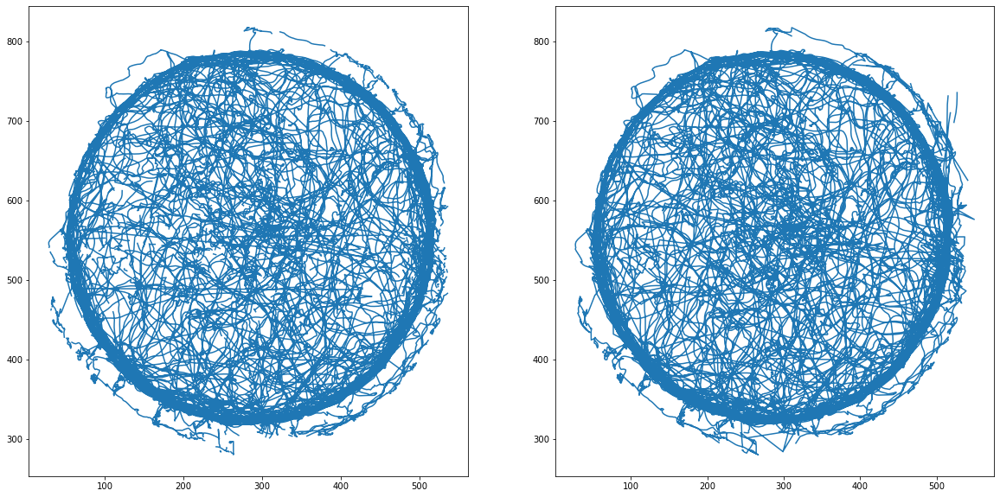

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_02.positrack2
positrack2 file with 36040 lines
Proportion of nan in original positrack2 file: 0.019
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_02.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 35
Number of speed issues: 0
Proportion of nan in online tracking: 0.019
Proportion of nan in offline tracking: 0.004
Number of np.nan filling using dlc: 608
Proportion of nan after merging: 0.003


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.000
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_02.positrack2_post


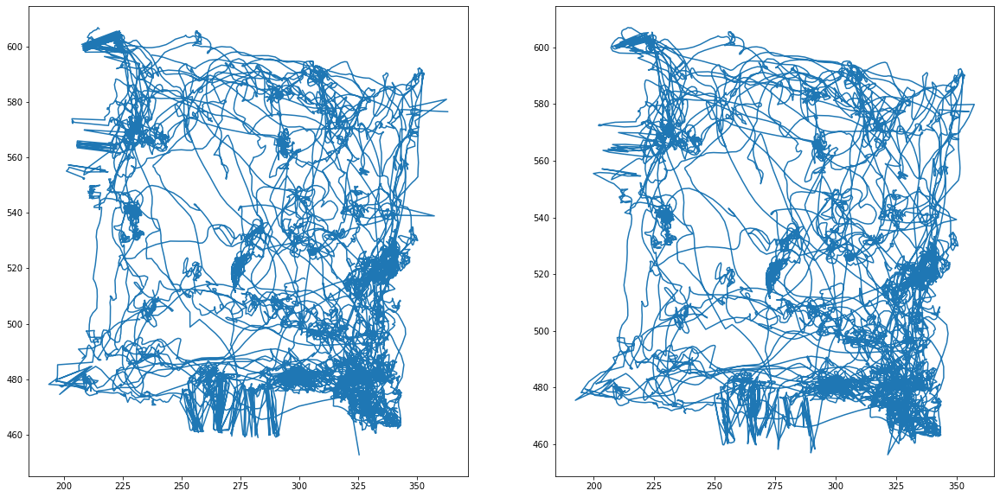

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_03.positrack2
positrack2 file with 54054 lines
Proportion of nan in original positrack2 file: 0.111
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_03.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 207
Number of speed issues: 271


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of nan in online tracking: 0.114
Proportion of nan in offline tracking: 0.040
Number of np.nan filling using dlc: 2676
Proportion of nan after merging: 0.066
Proportion of np.nan after gh filtering processing: 0.039
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_03.positrack2_post


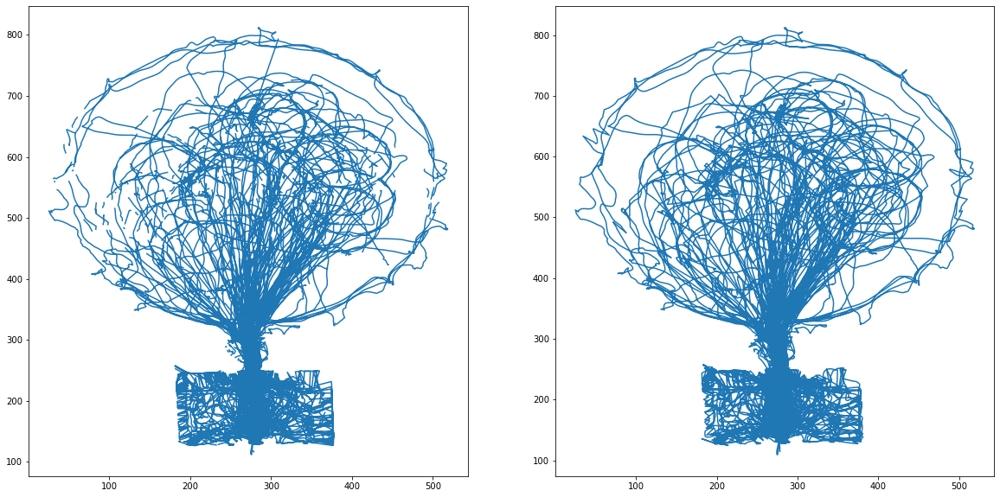

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_04.positrack2
positrack2 file with 54074 lines
Proportion of nan in original positrack2 file: 0.079
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_04.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 256
Number of speed issues: 289
Proportion of nan in online tracking: 0.084
Proportion of nan in offline tracking: 0.021
Number of np.nan filling using dlc: 2930
Proportion of nan after merging: 0.031


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.015
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_04.positrack2_post


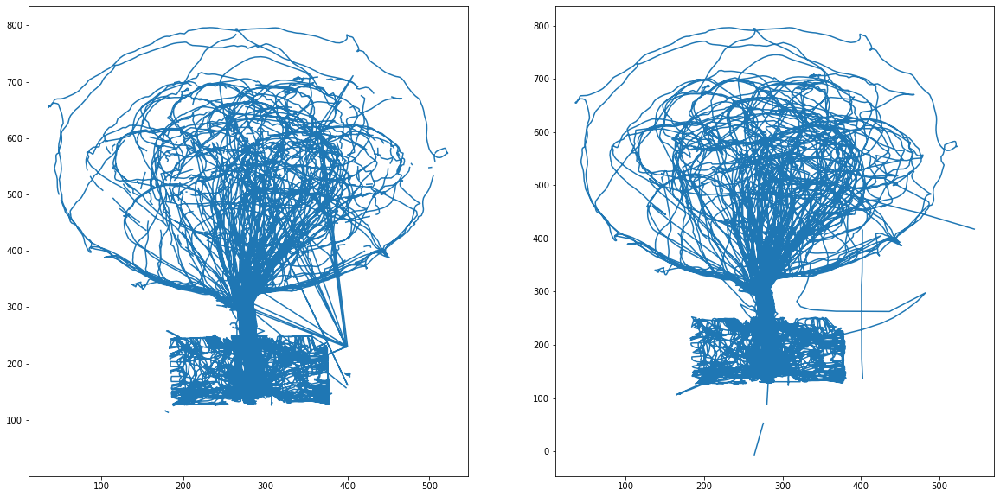

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_05.positrack2
positrack2 file with 54097 lines
Proportion of nan in original positrack2 file: 0.064
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_05.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 306
Number of speed issues: 304
Proportion of nan in online tracking: 0.069
Proportion of nan in offline tracking: 0.019
Number of np.nan filling using dlc: 2539
Proportion of nan after merging: 0.024


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.007
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_05.positrack2_post


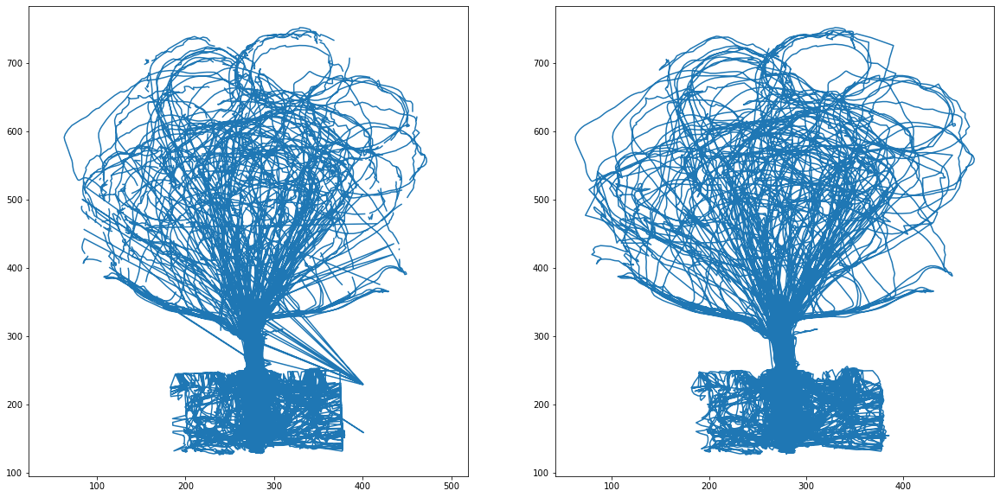

Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_06.positrack2
positrack2 file with 36035 lines
Proportion of nan in original positrack2 file: 0.084
Loading  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_06.offline.positrack2
Number of delta time == 0: 0
Number of speed issues: 32
Number of speed issues: 237
Proportion of nan in online tracking: 0.085
Proportion of nan in offline tracking: 0.072
Number of np.nan filling using dlc: 1368
Proportion of nan after merging: 0.047


/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: divide by zero encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
/tmp/ipykernel_151777/4036275516.py:46: RuntimeWarning: invalid value encountered in true_divide
  speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm


Proportion of np.nan after gh filtering processing: 0.040
Saving output to  /adata/projects/autopi_ca1/mn9686/mn9686-29102021-0106/mn9686-29102021_06.positrack2_post


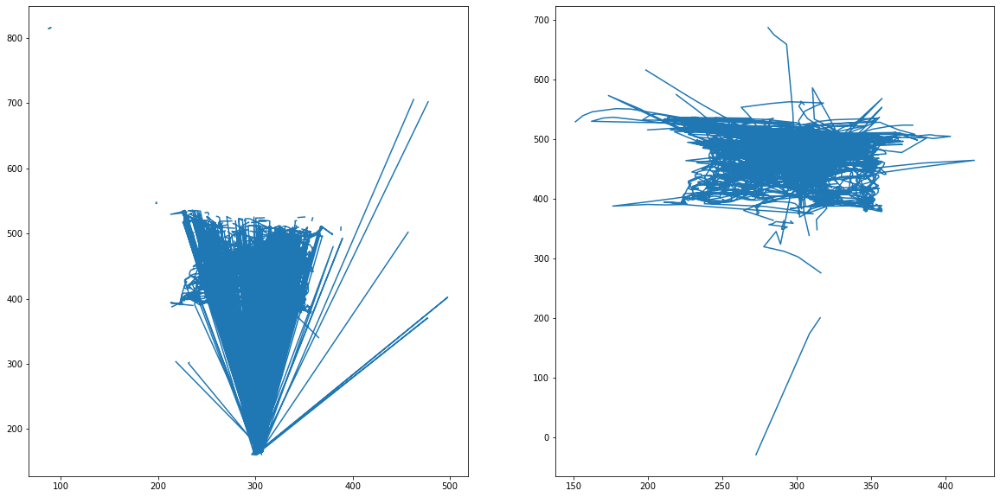

In [270]:
for sSes in sSesList[38:43]:
    post_processing_positrack2_files(sSes)

# Notes on how we can improving tracking offline

### Loading data

In [3]:
fn = "/adata/projects/autopi_ca1/mn9686/mn9686-01112021-0106/mn9686-01112021_04.offline.positrack2"
df1 = pd.read_csv(fn)

fn = "/adata/projects/autopi_ca1/mn9686/mn9686-01112021-0106/mn9686-01112021_04.positrack2"
df = pd.read_csv(fn)

In [4]:
df

,frame_no,acq_time_source_0,acq_time_source_1,acq_time_source_2,processing_start_time,processing_duration,view_id,left_led_x,left_led_y,left_led_size,right_led_x,right_led_y,right_led_size,x,y,hd
0,1,1.635783e+09,1.635783e+09,1.635783e+09,1.635783e+09,0.006283,0,287.269,279.974,7.552,268.915,281.860,9.358,278.092,280.917,84.134
1,2,1.635783e+09,1.635783e+09,1.635783e+09,1.635783e+09,0.007786,0,286.574,286.920,7.830,268.214,289.282,9.701,277.394,288.101,82.670
2,3,1.635783e+09,1.635783e+09,1.635783e+09,1.635783e+09,0.005758,0,267.450,295.666,7.610,285.749,293.795,7.719,276.599,294.731,264.161
3,4,1.635783e+09,1.635783e+09,1.635783e+09,1.635783e+09,0.006907,0,NaN,NaN,NaN,285.460,298.000,5.000,NaN,NaN,NaN
4,5,1.635783e+09,1.635783e+09,1.635783e+09,1.635783e+09,0.004776,0,NaN,NaN,NaN,265.328,302.746,8.587,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54036,54037,1.635785e+09,1.635785e+09,1.635785e+09,1.635785e+09,0.006669,0,260.004,423.301,8.517,278.435,418.840,10.905,269.219,421.071,256.392
54037,54038,1.635785e+09,1.635785e+09,1.635785e+09,1.635785e+09,0.005972,0,258.726,416.558,8.283,277.125,411.677,10.660,267.926,414.117,255.143
54038,54039,1.635785e+09,1.635785e+09,1.635785e+09,1.635785e+09,0.009452,0,258.081,409.916,8.486,276.407,405.208,10.678,267.244,407.562,255.592
54039,54040,1.635785e+09,1.635785e+09,1.635785e+09,1.635785e+09,0.012105,0,258.150,402.887,9.201,276.653,399.061,10.722,267.401,400.974,258.316


In [5]:
df1

,frame_no,acq_time_source_0,processing_start_time,processing_duration,view_id,LedLeft_x,LedLeft_y,LedLeft_p,LedRight_x,LedRight_y,LedRight_p,x,y,hd,frame_offset_x,frame_offset_y,cropped_dim_x,cropped_dim_y
0,1,NaN,NaN,NaN,0,280.880,265.973,0.999322,270.896,276.535,0.999146,275.888,271.254,0.757,100,0,340,340
1,2,NaN,NaN,NaN,0,284.261,285.617,0.999489,269.854,289.047,0.999704,277.057,287.332,1.337,200,196,150,150
2,3,NaN,NaN,NaN,0,282.804,290.204,0.999944,268.298,294.840,0.999982,275.551,292.522,1.261,202,212,150,150
3,4,NaN,NaN,NaN,0,280.999,297.628,0.997577,266.307,301.404,0.995647,273.653,299.516,1.319,200,217,150,150
4,5,NaN,NaN,NaN,0,278.200,297.941,0.999881,263.402,302.485,0.999980,270.801,300.213,1.273,198,224,150,150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54036,54037,NaN,NaN,NaN,0,255.828,421.066,0.999984,278.463,419.230,0.999905,267.146,420.148,-1.652,194,351,150,150
54037,54038,NaN,NaN,NaN,0,255.881,413.941,0.999997,276.123,412.858,0.999982,266.002,413.399,-1.624,192,345,150,150
54038,54039,NaN,NaN,NaN,0,255.430,407.510,0.999996,276.380,405.902,0.999962,265.905,406.706,-1.647,191,338,150,150
54039,54040,NaN,NaN,NaN,0,255.336,400.900,0.999998,276.732,400.326,0.999981,266.034,400.613,-1.598,190,331,150,150


From degrees to radians

In [7]:
if (np.nanmax(df.hd)>np.pi): # if in degrees
    df.hd = df.hd/360*np.pi*2
    df.hd = np.arctan2(np.sin(df.hd),np.cos(df.hd))
df

,frame_no,acq_time_source_0,acq_time_source_1,acq_time_source_2,processing_start_time,processing_duration,view_id,left_led_x,left_led_y,left_led_size,right_led_x,right_led_y,right_led_size,x,y,hd
0,1,1.635783e+09,1.635783e+09,1.635783e+09,1.635783e+09,0.006283,0,287.269,279.974,7.552,268.915,281.860,9.358,278.092,280.917,1.468415
1,2,1.635783e+09,1.635783e+09,1.635783e+09,1.635783e+09,0.007786,0,286.574,286.920,7.830,268.214,289.282,9.701,277.394,288.101,1.442864
2,3,1.635783e+09,1.635783e+09,1.635783e+09,1.635783e+09,0.005758,0,267.450,295.666,7.610,285.749,293.795,7.719,276.599,294.731,-1.672706
3,4,1.635783e+09,1.635783e+09,1.635783e+09,1.635783e+09,0.006907,0,NaN,NaN,NaN,285.460,298.000,5.000,NaN,NaN,NaN
4,5,1.635783e+09,1.635783e+09,1.635783e+09,1.635783e+09,0.004776,0,NaN,NaN,NaN,265.328,302.746,8.587,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54036,54037,1.635785e+09,1.635785e+09,1.635785e+09,1.635785e+09,0.006669,0,260.004,423.301,8.517,278.435,418.840,10.905,269.219,421.071,-1.808301
54037,54038,1.635785e+09,1.635785e+09,1.635785e+09,1.635785e+09,0.005972,0,258.726,416.558,8.283,277.125,411.677,10.660,267.926,414.117,-1.830100
54038,54039,1.635785e+09,1.635785e+09,1.635785e+09,1.635785e+09,0.009452,0,258.081,409.916,8.486,276.407,405.208,10.678,267.244,407.562,-1.822263
54039,54040,1.635785e+09,1.635785e+09,1.635785e+09,1.635785e+09,0.012105,0,258.150,402.887,9.201,276.653,399.061,10.722,267.401,400.974,-1.774721


Remove line in which delta time is 0. 

(array([3.0000e+00, 1.4000e+01, 4.1000e+01, 2.2200e+02, 2.4100e+03,
        2.1894e+04, 2.5055e+04, 3.8850e+03, 4.5700e+02, 5.9000e+01]),
 array([0.00504041, 0.00969412, 0.01434784, 0.01900156, 0.02365527,
        0.02830899, 0.0329627 , 0.03761642, 0.04227014, 0.04692385,
        0.05157757]),
 <BarContainer object of 10 artists>)

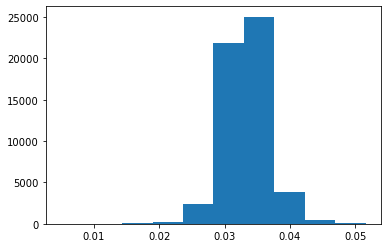

In [12]:
#dt=np.diff(df.acq_time_source_0,append=np.nan)
#indices = dt!=0
#df = df[indices]
#df1 = df1[indices]

plt.hist(df.acq_time_source_2.diff())


Make a figure to highlight the current problems in the data that can be fixed.

/tmp/ipykernel_104424/1821456192.py:51: RuntimeWarning: divide by zero encountered in true_divide
  speed = np.sqrt(dx**2+dy**2)/dt
/tmp/ipykernel_104424/1821456192.py:51: RuntimeWarning: invalid value encountered in true_divide
  speed = np.sqrt(dx**2+dy**2)/dt
/tmp/ipykernel_104424/1821456192.py:52: RuntimeWarning: divide by zero encountered in true_divide
  speed1 = np.sqrt(dx1**2+dy1**2)/dt


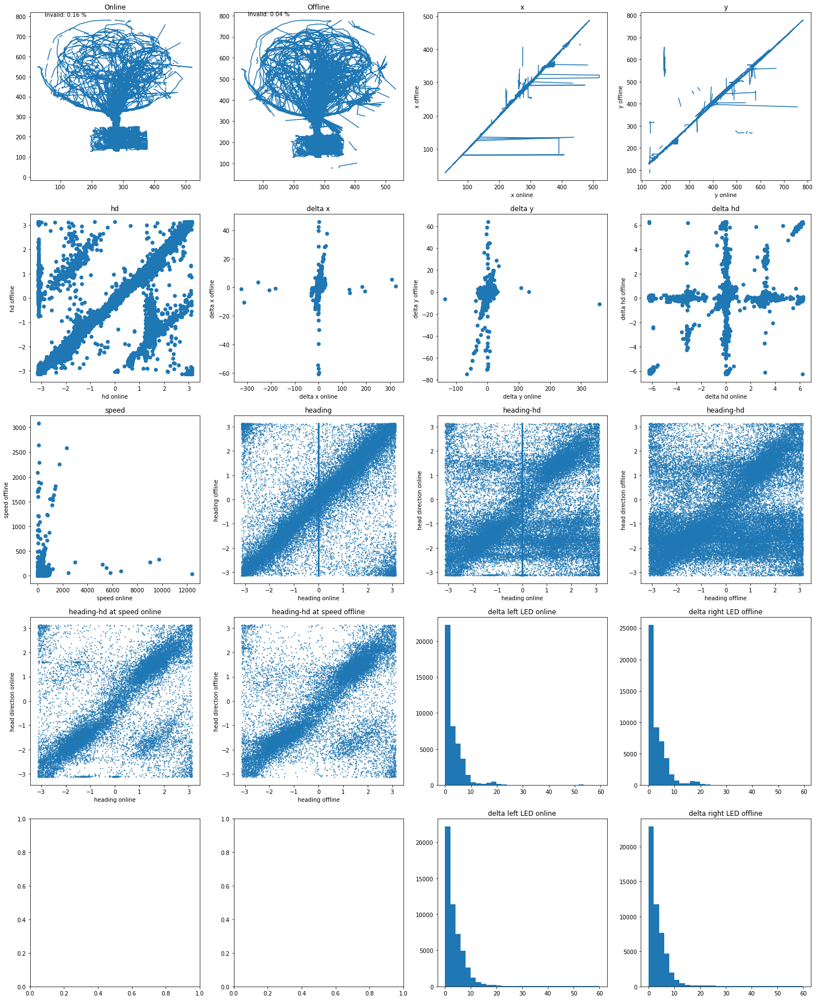

In [8]:
fig, ax = plt.subplots(5,4,figsize=(25,32))

ax[0,0].plot(df.x,df.y)
ax[0,0].set_title("Online")
ax[0,0].text(50,800,"Invalid: {:.2f} %".format(np.sum(np.isnan(df.x))/df.shape[0]))
ax[0,1].plot(df1.x,df1.y)
ax[0,1].set_title("Offline")
ax[0,1].text(50,800,"Invalid: {:.2f} %".format(np.sum(np.isnan(df1.x))/df1.shape[0]))


ax[0,2].plot(df.x,df1.x)
ax[0,2].set_title("x")
ax[0,2].set_xlabel("x online")
ax[0,2].set_ylabel("x offline")
ax[0,3].plot(df.y,df1.y)
ax[0,3].set_title("y")
ax[0,3].set_xlabel("y online")
ax[0,3].set_ylabel("y offline")

ax[1,0].scatter(df.hd,df1.hd)
ax[1,0].set_title("hd")
ax[1,0].set_xlabel("hd online")
ax[1,0].set_ylabel("hd offline")


dt = np.diff(df.acq_time_source_0,append = np.nan)
dx = np.diff(df.x,append = np.nan)
dx1 = np.diff(df1.x,append = np.nan)
dy = np.diff(df.y,append = np.nan)
dy1 = np.diff(df1.y,append = np.nan)
dhd = np.diff(df.hd,append = np.nan)
dhd1 = np.diff(df1.hd,append = np.nan)


ax[1,1].scatter(dx,dx1)
ax[1,1].set_title("delta x")
ax[1,1].set_xlabel("delta x online")
ax[1,1].set_ylabel("delta x offline")

ax[1,2].scatter(dy,dy1)
ax[1,2].set_title("delta y")
ax[1,2].set_xlabel("delta y online")
ax[1,2].set_ylabel("delta y offline")

ax[1,3].scatter(dhd,dhd1)
ax[1,3].set_title("delta hd")
ax[1,3].set_xlabel("delta hd online")
ax[1,3].set_ylabel("delta hd offline")


speed = np.sqrt(dx**2+dy**2)/dt
speed1 = np.sqrt(dx1**2+dy1**2)/dt
heading = np.arctan2(dy,dx)
heading1 = np.arctan2(dy1,dx1)


ax[2,0].scatter(speed,speed1)
ax[2,0].set_title("speed")
ax[2,0].set_xlabel("speed online")
ax[2,0].set_ylabel("speed offline")

ax[2,1].scatter(heading,heading1,s=1)
ax[2,1].set_title("heading")
ax[2,1].set_xlabel("heading online")
ax[2,1].set_ylabel("heading offline")


ax[2,2].scatter(heading,df.hd,s=1)
ax[2,2].set_title("heading-hd")
ax[2,2].set_xlabel("heading online")
ax[2,2].set_ylabel("head direction online")

ax[2,3].scatter(heading1,df1.hd,s=1)
ax[2,3].set_title("heading-hd")
ax[2,3].set_xlabel("heading offline")
ax[2,3].set_ylabel("head direction offline")

indices = speed > 50

ax[3,0].scatter(heading[indices],df.hd[indices],s=1)
ax[3,0].set_title("heading-hd at speed online")
ax[3,0].set_xlabel("heading online")
ax[3,0].set_ylabel("head direction online")


ax[3,1].scatter(heading1[indices],df1.hd[indices],s=1)
ax[3,1].set_title("heading-hd at speed offline")
ax[3,1].set_xlabel("heading offline")
ax[3,1].set_ylabel("head direction offline")

dleft = np.sqrt(np.diff(df.left_led_x,append=np.nan)**2 + np.diff(df.left_led_y,append=np.nan)**2)
dright = np.sqrt(np.diff(df.right_led_x,append=np.nan)**2 + np.diff(df.right_led_y,append=np.nan)**2)
dleft = dleft[dleft<60]
dright = dright[dright<60]
dleft1 = np.sqrt(np.diff(df1.LedLeft_x,append=np.nan)**2 + np.diff(df1.LedLeft_y,append=np.nan)**2)
dright1 = np.sqrt(np.diff(df1.LedRight_x,append=np.nan)**2 + np.diff(df1.LedRight_y,append=np.nan)**2)
dleft1 = dleft1[dleft1<60]
dright1 = dright1[dright1<60]


ax[3,2].hist(dleft,bins=30)
ax[3,2].set_title("delta left LED online")
ax[3,3].hist(dright,bins=30)
ax[3,3].set_title("delta right LED offline")


ax[4,2].hist(dleft1,bins=30)
ax[4,2].set_title("delta left LED online")
ax[4,3].hist(dright1,bins=30)
ax[4,3].set_title("delta right LED offline")


plt.show()


## Conclusions upon initial inspection of the data

* We get fewer invalid data point using the Deeplabcut that current online tracking. Expected as online we need to prevent false positives because of cable actuator.
* There are jumps in position, but mainly in the offline (dlc) signal.
* We get some HD flip, where adjacent HD swap by 180 degrees. 
* We get more jumps in head direction offline.
* At high speed, heading can be used to identify inapropriate 180 head-direction flip. 
* Irrealistic speed can be used to identify false positive.


## Corrections

* We have a moving object that is restricted by physical laws. Its position or head-direction can't change abruptly.
* Speed and acceleration can't change abruptly. 
* We can use the previous positions, speed, direction and angular head-direction velocity, heading, angular heading velocity to predict future data points. 
* When the camera view is changing, we should only do path integration to update position. Head-direction can be updated as usual.
* If the mouse is not detected for more than 1 second, set to invalid.

We will need to implement some form of Kalman filter. 

We can start with a very naive implementation and improve it with time.

In [13]:
def remove_speed_jumps(df, time, px_per_cm , max_speed=100):
    """
    set x,y,hd to np.nan when speed is above a threshod
    
    Argument
    df: DataFrame with x, y , hd data
    time: time of each frame in DataFrame
    """

    dt = np.diff(time,append = np.nan)
    dx = np.diff(df.x,append = np.nan)
    dy = np.diff(df.y,append = np.nan)
    speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
    df["speed"] = speed
    
    speed_issues = speed > max_speed
    print("Number of speed issues: {}".format(np.sum(speed_issues)))
    
    df.x[speed_issues] = np.nan
    df.y[speed_issues] = np.nan
    df.hd[speed_issues] = np.nan
    df.speed[speed_issues] = np.nan
    
    return df

def correct_head_direction_180_flip(df, time, px_per_cm , min_speed=10, max_angle=np.pi/1.2):
    """
    Rotate by pi the head-direction if the difference between heading and head-direction is more than max_angle when the animal is moving above a speed threshold. 
    
    Mice do not move forward with their head pointing backward. If we get this in our data, it is likely due to a swap in the 2 LEDs 
    
    Argument
    df: DataFrame with x, y , hd data
    time: time of each frame in DataFrame
    px_per_cm: pixels per cm
    min_speed: minimal speed at which heading and head-direction should be compared
    max_angle: max angle between heading and head-direction that is considered valid.
    """
        
    dt = np.diff(time,append = np.nan)
    dx = np.diff(df.x,append = np.nan)
    dy = np.diff(df.y,append = np.nan)
    speed = (np.sqrt(dx**2+dy**2)/dt)/px_per_cm
    df["speed"] = speed
    df["heading"] = np.arctan2(dy,dx)
    
    # angle between 2 vector is the acos of the dot product
    delta_angle = np.arccos( np.cos(df.hd)*np.cos(df.heading)+np.sin(df.hd)*np.sin(df.heading) )
    
    swap_indices = np.logical_and(df.speed>min_speed,delta_angle>max_angle)
    
    df.hd[swap_indices] = np.arctan2(np.sin(df.hd[swap_indices]+np.pi),np.cos(df.hd[swap_indices]+np.pi))
    
    return df

def merge_online_offline_tracking(df,df1,prob=0.995):
    """
    Function to fill missing x,y,hd from online tracking with dlc model output.
    
    This only works if we have done offline tracking. 
    
    We fill only when dlc was pretty sure about detecting the mouse (data above prob threshold)
    
    Arguments:
    df : online tracking data (positrack2 file)
    df1: offline tracking data (offline dlc model output)
    """
    
    
    i1 = np.isnan(df.x) # df is nan
    print("Proportion of nan in online tracking: {:.3f}".format(np.sum(np.isnan(df.x)/df.x.shape[0])))
    
    if df1 is None:
        print("No valid df1")
        return
    
    i2 = np.logical_and(df1.LedLeft_p>prob, df1.LedRight_p>prob) # we have good dlc confidence
    i = np.logical_and(i1,i2)
    
    print("Proportion of nan in offline tracking: {:.3f}".format(np.sum(np.isnan(df1.x)/df1.x.shape[0])))
                                                                 
    print("Number of np.nan filling using dlc: {}".format(np.sum(i)))
    df.x[i] = df1.x[i]
    df.y[i] = df1.y[i]
    df.hd[i] = df1.hd[i]
                                                                 
    print("Proportion of nan after merging: {:.3f}".format(np.sum(np.isnan(df.x)/df.x.shape[0])))
                                                                 
    return df
